In [1]:
import cv2
import os 
import glob
import random 
import matplotlib.pyplot as plt
import copy
import sys
sys.path.insert(0, "/home/lab530/KenYu/ml_toolkit/kitti")
from iou_3d import get_3d_box, box3d_iou, box2d_iou, box2d_iog

import json 
import numpy as np 
from math import sqrt
from util_kitti import init_img_plt_without_bev, init_img_plt, kitti_label_file_parser, kitti_calib_file_parser, init_img_plt_with_plasma, KITTI_Object
from util_kitti import draw_corner_2D, draw_2Dbox, draw_birdeyes

NUM_IMAGE_SHOW = 20
# random.seed(5278)

VEHICLES = ["Car"] # What kind of object added to base image
N_ADD_OBJ = 3 # How many newly added object in a image
SOLID_RATIO = 1.0 # How solid will the added patch looks like
IS_SEG_GT = True # False # Use segmentation label or not
IS_DEP_CHECK = True # True # False # True
IS_OBJ_Z_CHANGE = True # False # True

IMAGE_DIR = "/home/lab530/KenYu/kitti/training/image_2/"
LABEL_DIR = "/home/lab530/KenYu/kitti/training/label_2/"
CALIB_DIR = "/home/lab530/KenYu/kitti/training/calib/"
SEGMT_DIR = "/home/lab530/KenYu/kitti/training/image_bbox_label/" # Only used when IS_SEG_GT = true
DEPTH_DIR = "/home/lab530/KenYu/kitti/training/image_depth/"
TRAIN_SPLIT_TXT = "/home/lab530/KenYu/visualDet3D/visualDet3D/data/kitti/chen_split/train.txt"

# TODO 2D IOU check might make it a good way to do it ? 
# TODO multiple object generation should render object by the z_3d order, 
#      but if we use half transparant rander, this won't be a big problem

class Object(KITTI_Object):
    def __init__(self, str_line, tf_matrix, idx_img = None, idx_line = None):
        super().__init__(str_line, tf_matrix, idx_img, idx_line)
        self.corners_3d = get_3d_box((self.l, self.w, self.h), self.rot_y, (self.x3d, self.y3d, self.z3d))
        
        # Find segment labels
        json_path = SEGMT_DIR + f"{idx_img}_{idx_line}.json"
        #
        self.seg_points = [] # Only use if IS_SEG_GT == true
        if IS_SEG_GT and os.path.exists(json_path):
            with open(json_path, 'r') as f:
                raw_json = json.load(f)
                self.seg_points = raw_json['shapes'][0]["points"]

    def reprojection(self):
        super().reprojection()
        self.corners_3d = get_3d_box((self.l, self.w, self.h), self.rot_y, (self.x3d, self.y3d, self.z3d))

def check_depth_map(gt_add, tar_depth):
    try:
        # Calculate the number of pixels above the threshold
        num_above_threshold = np.count_nonzero(tar_depth[gt_add.ymin:gt_add.ymax, gt_add.xmin:gt_add.xmax] < gt_add.cz)
        percent_above_threshold = num_above_threshold / gt_add.area
        # print(f"percent_above_threshold = {percent_above_threshold}")
        
        if percent_above_threshold > 0.25: 
            return False
        else: 
            return True
    except TypeError:
        pass
    except Exception as e:
        print(f"[ERROR] {e}")
        return False

def check_suitable(gt_add, gts_tar):
    '''
    Check whether gt_add is sutiable to add to gts_tar
    '''
    for gt_tar in gts_tar:
        # Get 2D IOU, Avoid far object paste on nearer object
        iou_2d = box2d_iou((gt_add.xmin, gt_add.ymin, gt_add.xmax, gt_add.ymax),
                           (gt_tar.xmin, gt_tar.ymin, gt_tar.xmax, gt_tar.ymax))
        if iou_2d > 0.0 and gt_add.z3d > gt_tar.z3d: return False
        
        # IoG check
        b1_iog, b2_iog = box2d_iog((gt_add.xmin, gt_add.ymin, gt_add.xmax, gt_add.ymax),
                                   (gt_tar.xmin, gt_tar.ymin, gt_tar.xmax, gt_tar.ymax))
        if max(b1_iog, b2_iog) > 0.7 : return False
        
        # Get 3D IOU, Avoid 3D bbox collide with each other on BEV
        try: # TODO this is because I can't solve ZeroDivision in iou_3d.py
            iou_3db, iou_bev = box3d_iou(gt_tar.corners_3d, gt_add.corners_3d)
        except Exception as e:
            print("Error:", str(e))
            iou_3db, iou_bev = (0, 0)
            return False
        if iou_bev > 0.0: return False
    return True


/home/lab530/anaconda3/envs/KenYuGAC/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Show DORN depth estimation result

In [2]:
# Only augumented training split, don't augment validation set
with open(TRAIN_SPLIT_TXT, 'r') as f:
    lines = f.read().splitlines()
    lines = list(lines for lines in lines if lines) # Delete empty lines

# Filter depth_map unavailible image(This only use when the DORN is still running......)
depth_fn = [p.split("/")[-1].split(".")[0] for p in glob.glob(os.path.join(DEPTH_DIR, "*.png"))]
image_fn = [l for l in lines if l in depth_fn]
print(f"Find {len(image_fn)} source images.")

random.shuffle(image_fn)
chose_name = image_fn[:NUM_IMAGE_SHOW]
# chose_name = ['003308', '000712', '007360', '003993', '001718', '000039', '006050', '000249', '005191', '000631', '006090']
# chose_name = ['002318', '002368', '002099']

# Transform image 
chose_img = []
chose_dep = []
chose_P2  = []
for name in chose_name:
    P2 = kitti_calib_file_parser(os.path.join(CALIB_DIR, f"{name}.txt"))
    img       = cv2.imread(os.path.join(IMAGE_DIR, f"{name}.png"))
    img_depth = cv2.imread(os.path.join(DEPTH_DIR, f"{name}.png"), cv2.IMREAD_GRAYSCALE)
    
    chose_P2.append(P2)
    chose_img.append(img)
    chose_dep.append(img_depth)
# 

# # Show the depth maps
# for i in range(NUM_IMAGE_SHOW):
#     init_img_plt_without_bev([chose_img[i]], titles = [chose_name[i]])
#     init_img_plt_with_plasma([chose_dep[i]], titles = [chose_name[i]])


Find 3095 source images.


# Get Instacne pool

In [3]:

objs_pool = []

# Only augumented training split, don't augment validation set
with open(TRAIN_SPLIT_TXT, 'r') as f:
    lines    = f.read().splitlines()
    images_fn = list(lines for lines in lines if lines) # Delete empty lines
print(f"Find {len(images_fn)} source images.")

for img_fn in images_fn:
    P2   = kitti_calib_file_parser(os.path.join(CALIB_DIR, f"{img_fn}.txt"))
    
    # objs = kitti_label_file_parser(os.path.join(LABEL_DIR, f"{img_fn}.txt"), P2)
    with open(os.path.join(LABEL_DIR, f"{img_fn}.txt")) as f:
        lines = f.read().splitlines()
        lines = list(lines for lines in lines if lines) # Delete empty lines
    objs =  [Object(str_line + " NA",
                    idx_img = img_fn,
                    idx_line = idx_line, 
                    tf_matrix = P2) for idx_line, str_line in enumerate(lines)]
    #
    for obj in objs:
        # Filter inappropiate objs
        if obj.category in VEHICLES and obj.truncated < 0.5 and obj.occluded == 0.0 and obj.area > 3000:
            if IS_SEG_GT and len(obj.seg_points) == 0 : continue
            objs_pool.append(obj)

print(f"Number of object in instance pool: {len(objs_pool)}")

Find 3712 source images.
Number of object in instance pool: 524


# Check and paste object

Processed 0/20 image
[WARNING] Cannot find any suitable gt to add to 000824.png
Processed 1/20 image
Processed 2/20 image
Processed 3/20 image
Processed 4/20 image
Processed 5/20 image
Processed 6/20 image
Processed 7/20 image
Processed 8/20 image
Processed 9/20 image
[WARNING] Cannot find any suitable gt to add to 005666.png
Processed 10/20 image
Processed 11/20 image
Processed 12/20 image
Processed 13/20 image
Processed 14/20 image
Processed 15/20 image
Processed 16/20 image
Processed 17/20 image
Processed 18/20 image
Processed 19/20 image
aug_fail_img = ['000824', '005666']
There are 2 images can't be augumented!


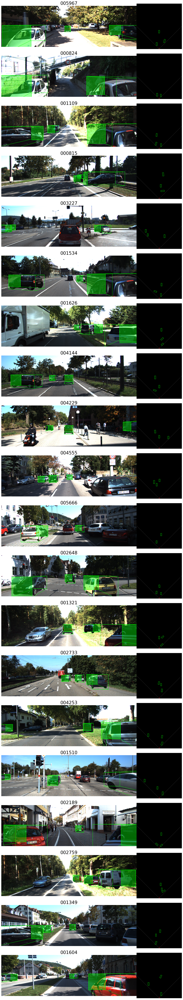

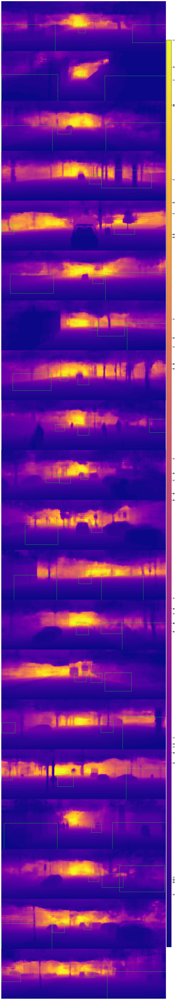

In [4]:
aug_fail_img = []
img_rst = []
gts_rst = []
dep_rst = []
for i_img, img_name in enumerate(chose_name):
    # Load image
    img_tar = cv2.imread(os.path.join(IMAGE_DIR, f"{img_name}.png"))

    # Load Calibration
    P2 = kitti_calib_file_parser(CALIB_DIR + f"{img_name}.txt")
    
    # Load depth map
    depth_map_path = os.path.join(DEPTH_DIR, f"{img_name}.png")
    img_tar_depth = None
    if IS_DEP_CHECK:
        if os.path.exists(depth_map_path):
            img_tar_depth = cv2.imread(depth_map_path, cv2.IMREAD_GRAYSCALE)
        else:
            print(f"[WARNING] No depth map find in {depth_map_path}")
    dep_rst.append(img_tar_depth)
    
    # Load target gt objects
    with open(os.path.join(LABEL_DIR, f"{img_name}.txt")) as f:
        lines = f.read().splitlines()
        lines = list(lines for lines in lines if lines) # Delete empty lines
    gts_tar =  [Object(str_line + " NA",
                    idx_img = os.path.join(LABEL_DIR, f"{img_name}.txt").split('/')[-1].split('.')[0],
                    idx_line = idx_line, 
                    tf_matrix = P2) for idx_line, str_line in enumerate(lines)]
    
    # Add objects in the source image
    for obj_idx in range(N_ADD_OBJ):
        random.shuffle(objs_pool)

        gt_rst_new = None
        gt_rst_old = None
        for i_gt_add, gt_add in enumerate(objs_pool):
            # Don't use object without segmented label
            if IS_SEG_GT and len(gt_add.seg_points) == 0: continue
            #
            gt_add_old = copy.deepcopy( gt_add )
            gt_add_new = copy.deepcopy( gt_add )
            
            # Jitter Z direction
            if IS_OBJ_Z_CHANGE:
                cz_new = random.uniform( gt_add.cz*0.8, gt_add.cz*1.2 )
                s = gt_add.cz / cz_new
                
                d_bev_old = sqrt(gt_add.x3d**2 + gt_add.z3d**2)
                d_bev_new = sqrt(cz_new**2 - (gt_add.y3d - gt_add.h/2)**2)
                
                gt_add_new.x3d *= d_bev_new / d_bev_old
                gt_add_new.z3d *= d_bev_new / d_bev_old
                gt_add_new.P2 = P2
                gt_add_new.reprojection()
            
            # Check whether it's a good spawn by scanning through all the existed groundTrue
            if not check_suitable(gt_add_new, gts_tar): continue
            
            # Get aug image
            img_src = cv2.imread(IMAGE_DIR + f"{gt_add_new.idx_img}.png")
            
            img_tar_h, img_tar_w, _ = img_tar.shape
            img_src_h, img_src_w, _ = img_src.shape
            
            # Source image
            patch_src = img_src[gt_add_old.ymin:gt_add_old.ymax,
                                gt_add_old.xmin:gt_add_old.xmax]
            
            patch_tar_w, patch_tar_h = (int(gt_add_new.xmax - gt_add_new.xmin),
                                        int(gt_add_new.ymax - gt_add_new.ymin))

            # Resize source patch to fit the target patch
            patch_src = cv2.resize(patch_src, (patch_tar_w, patch_tar_h), interpolation=cv2.INTER_AREA)
            if IS_SEG_GT:
                old_h = gt_add_old.ymax - gt_add_old.ymin
                old_w = gt_add_old.xmax - gt_add_old.xmin
                for i, (xp, yp) in enumerate(gt_add_new.seg_points):
                    gt_add_new.seg_points[i][0] *= (patch_tar_w/old_w)
                    gt_add_new.seg_points[i][1] *= (patch_tar_h/old_h)

            # 2D bbox saturation and crop image on the bournding
            if gt_add_new.xmin < 0 :
                patch_src = patch_src[:, abs(gt_add_new.xmin):]
                gt_add_new.xmin = 0
            if gt_add_new.ymin < 0 :
                patch_src = patch_src[abs(gt_add_new.ymin):, :]
                gt_add_new.ymin = 0
            if gt_add_new.xmax > img_tar_w:
                patch_src = patch_src[:, :img_tar_w-gt_add_new.xmax]
                gt_add_new.xmax = img_tar_w
            if gt_add_new.ymax > img_tar_h:
                patch_src = patch_src[:img_tar_h-gt_add_new.ymax, :]
                gt_add_new.ymax = img_tar_h
            
            # Check depth map
            if IS_DEP_CHECK and not check_depth_map(gt_add_new, img_tar_depth): continue

            gt_rst_old = gt_add_old
            gt_rst_new = gt_add_new
            break

        # If couldn't find any augmented image, copy paste image without modification
        if gt_rst_new == None:
            aug_fail_img.append(img_name)
            print(f"[WARNING] Cannot find suitable gt to add to {img_name}.png")
            break
        
        # Paste the source instance on target image
        if IS_SEG_GT:
            mask = np.zeros_like(patch_src[:, :, 1])
            
            obj_countor = []
            for xp, yp in gt_rst_new.seg_points:
                obj_countor.append(np.array([[int(xp), int(yp)]], dtype=np.int32))

            cv2.drawContours(mask, np.array([obj_countor]), -1, 255, -1)
            img_tar[gt_rst_new.ymin:gt_rst_new.ymax, gt_rst_new.xmin:gt_rst_new.xmax][mask == 255] = patch_src[mask == 255]
        else:
            # Add new object on augmented image and .txt
            img_tar[gt_rst_new.ymin:gt_rst_new.ymax, gt_rst_new.xmin:gt_rst_new.xmax] = SOLID_RATIO*patch_src + \
            img_tar[gt_rst_new.ymin:gt_rst_new.ymax, gt_rst_new.xmin:gt_rst_new.xmax]*(1-SOLID_RATIO)
        
        # Add new object's label to source gts
        gts_tar.append(gt_rst_new)
        
    img_rst.append(img_tar)
    gts_rst.append(gts_tar)
    # 
    print(f"Processed {i_img}/{len(chose_name)} image")

print(f"aug_fail_img = {aug_fail_img}")
print(f"There are {len(aug_fail_img)} images can't be augumented!")

axs = init_img_plt(img_rst, chose_name)

if IS_DEP_CHECK: axs_depth = init_img_plt_with_plasma(dep_rst)

for i_img, img_name in enumerate(chose_name):
    for i_obj in range(N_ADD_OBJ):
    # for i_obj, obj in enumerate(gts_rst[i_img]):
        obj = gts_rst[i_img][-(i_obj+1)]
        #
        # color = [random.uniform(0.5, 1) for _ in range(3)]
        color = [0,1,0]
        
        # Draw bbox
        # draw_2Dbox   (axs[i_img][0], (obj.xmin, obj.ymin, obj.xmax, obj.ymax), color = color)
        draw_birdeyes(axs[i_img][1], obj, color = color, title = "123", is_print_confident = False)
        draw_corner_2D(axs[i_img][0], obj.corner_2D, color = color, is_draw_front = True)
        
        # Draw 2d check bbox on depth map
        if IS_DEP_CHECK: draw_2Dbox   (axs_depth[i_img], (obj.xmin, obj.ymin, obj.xmax, obj.ymax), color = color)
